In [ ]:
#MOUAD RIALI

In [1]:
import plotly as py
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
import seaborn as sns
import geopy

In [2]:
data=pd.read_csv('avito_contact.csv')

In [3]:
data

,nom,ville,region,datte offre,description,vues,phone number
0,Le Coin Gamer,Casablanca,Bourgogne,2020-03-31T01:43:03,"Salam Sur cette annoncé générique, nous metton...",1790 total,648880609
1,hamza kabrane,Casablanca,Casablanca,2020-03-31T01:37:05,A Vendre :HP Compaq Elite 8300 CMTCore i5 3470...,92 total,689643211
2,Ayman houssami,Casablanca,Derb Ghallef,2020-03-31T01:27:42,Je met en vente mon asus core i3 5 eme generat...,129 total,666367089
3,Ayman houssami,Casablanca,Derb Ghallef,2020-03-31T01:38:06,Je mets de vendre iphone 11 pro max bleu pour ...,169 total,666367089
4,houssam,Fès,Fès,2020-03-31T01:38:49,Pc hp très bon état li bghah marhba,65 total,621925378
...,...,...,...,...,...,...,...
145571,Mohamed,Tanger,Alia,2019-10-25T13:46:10,Any type of motion graphics Promo publicitaire...,358 total,621686073
145572,Recrutement,Safi,Autre secteur,2019-10-23T17:31:24,Nous recrutons pour le compte de notre client ...,555 total,649196856
145573,abder,Meknès,Hamria,2019-10-23T11:54:54,Dans le cadre de notre monté charge nous recr...,26 total,532021167
145574,karim Tavares,Marrakech,Sidi Ghanem,2019-11-22T08:10:10,POSE DE REVETEMENT DE PISCINEdes PROFESSIONNEL...,81 total,674621174


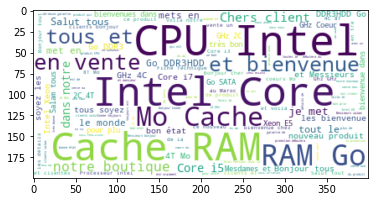

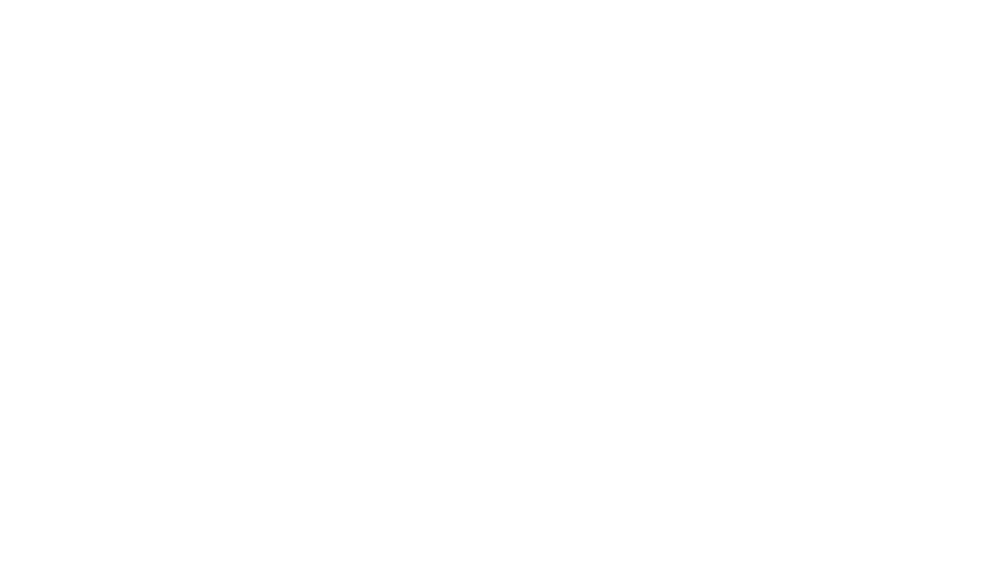

"\nici on peut determiner les mots plus utilises par les vendeurs en avito,\npar exemple on peut estimer que la plupart demande le Cash comme methode de paiment\nAinsi le grand nombre des personnes qui ont des boutiques par rapport ceux qui n'ont pas\n"

In [4]:
text=(list(data['description']))
my = ''.join(map(str, text))
wordcloud=WordCloud(max_font_size=50, max_words=1000, background_color="white").generate(my)
plt.imshow(wordcloud, interpolation='bilinear')
plt.figure(figsize=[100,60])
plt.axis("off")
plt.show()
"""
ici on peut determiner les mots plus utilises par les vendeurs en avito,
par exemple on peut estimer que la plupart demande le Cash comme methode de paiment
Ainsi le grand nombre des personnes qui ont des boutiques par rapport ceux qui n'ont pas
"""

In [5]:
data['vues']=[int(i[:-5]) for i in data['vues']]

In [6]:
dimm_vues=data.groupby(['datte offre']).sum()


#dessiner une graphe :
fig=go.Figure()
fig.add_trace(go.Scatter(x=dimm_vues.index, y=dimm_vues['vues'],
        mode='lines',
        name='les vues au courant du temps '))


In [7]:
len(set(data['ville']))

412

In [8]:
set(data['ville'])

{'Aarab Sebbah Gheris',
 'Aarab Sebbah Ziz',
 'Abadou',
 'Abaynou',
 'Abbou Lakhal',
 'Abdelghaya Souahel',
 'Abteh',
 'Adaghas',
 'Adar',
 'Adrej',
 'Aferkat',
 'Afourar',
 'Agadir',
 'Agadir Melloul',
 'Agafay',
 'Agdz',
 'Aghbala',
 'Aghbalou',
 "Aghbalou N'kerdous",
 'Aghouinite',
 'Agourai',
 'Aguelmous',
 'Ahfir',
 'Ahl Sidi Lahcen',
 'Ain Aouda',
 'Ain Attig',
 'Ain Bida',
 'Ain Cheggag',
 'Ain Harrouda',
 'Ain Karma',
 'Ain Leuh',
 'Ain Sbit',
 'Ain Sfa',
 'Ain Taoujdate',
 'Ain Tizgha',
 'Ait Amira',
 'Ait Baha',
 'Ait Belkacem',
 'Ait Ishaq',
 'Ait Melloul',
 'Ait Mimoun',
 'Ait Ouallal',
 'Ait Ourir',
 'Ait Yaazem',
 'Ait Yadine',
 'Ajdir',
 'Aklim',
 'Aknoul',
 'Al Aaroui',
 'Al Haouz',
 'Al Hoceima',
 'Al Oioun Sidi Mellouk',
 'Amizmiz',
 'Amskroud',
 'Aoulouz',
 'Aourir',
 'Aousserd',
 'Arekmane',
 'Arfoud',
 'Asilah',
 'Asni',
 'Assa',
 'Assa zag',
 'Ayir',
 'Azemmour',
 'Azilal',
 'Azla',
 'Azrou',
 'Aït Iaaza',
 'Bab Berred',
 'Bab Taza',
 'Barkine',
 'Bejaad',
 'Belfa

In [9]:
df=data.groupby(['ville']).count().sort_values(by=['region'])

In [10]:
df=df.where(df['region']>2).dropna()

In [11]:
#len(set(df.index))

In [12]:
#df.index

In [13]:
pos=list(df.index)

In [14]:
#fill the longitude and the latitude lists
lat,long=[],[]
for i in range(len(pos)):
    try:   
        locator = geopy.Nominatim(user_agent="myGeocoder",timeout=100)
        location = locator.geocode(pos[i]+", Maroc")
        lat.append(location.latitude) 
        long.append(location.longitude)
        print('success')
    except:
        lat.append(None) 
        long.append(None)
        print(pos[i])

success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
Al Oioun Sidi Mellouk
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
success
Imouzzer-Kendar
success
success
success
su

In [15]:
#create dataframe of regions,longitude,latitude and vistors
datta=pd.DataFrame({
    'ville':df.index,
    'longitude':long,
    'latitude':lat,
    'population':df['vues'],
})

In [16]:
datta_map=datta.dropna()

In [17]:
#mapppppppp!!!!!!!!!!!!!
df=datta_map
df['text'] = df['ville'] + '<br> ' + (df['population']).astype(str)+' visites'
limits = [(0,10),(11,50),(51,99),(100,200),(201,245)]
colors = ["yellow","green","lightseagreen","orange","red"]
provinces = []
df['text']
fig = go.Figure()
for i in range(len(limits)):
    lim = limits[i]
    df_sub = df[lim[0]:lim[1]]
    fig.add_trace(go.Scattergeo(
        lon = df_sub['longitude'],
        lat = df_sub['latitude'],
        text = df_sub['text'],
        marker = dict(
            size = df_sub['population']*1.25,
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(df['population'][lim[0]],df['population'][lim[1]])))    
fig.update_layout(
        title_text = 'nombre de vues par region<br>(Click legend to toggle traces)',
        showlegend = True,
        geo = dict(
            scope = 'world',
            landcolor = 'rgb(110, 150, 0)',
        )
    )
#fig.update_geos(projection_type="natural earth")
fig.show()
#c'est une carte interactive qu'on peut facilement la manipuler(Zoom,capture image,etc...)

C:\Users\mouad\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [18]:
#fig.update_geos(projection_type=<modes>)
modes=['equirectangular', 'mercator', 'orthographic', 'naturalearth', 'kavrayskiy7', 'miller', 'robinson', 'eckert4',
            'azimuthal equal area', 'azimuthal equidistant', 'conicequal area', 'conic conformal', 'conic equidistant',
            'gnomonic', 'stereographic', 'mollweide', 'hammer',
            'transverse mercator', 'albers usa', 'winkel tripel',
            'aitoff', 'sinusoidal']